# **Import liabraries**

In [303]:
import pandas as pd
import numpy as np
import re
from datetime import datetime

# Visualzation
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from plotly.subplots import make_subplots


# Encoding
from sklearn.preprocessing import OrdinalEncoder, LabelEncoder

# PreProcessing
from sklearn.preprocessing import StandardScaler


# Modeling
from sklearn.model_selection import train_test_split ,GridSearchCV
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier , VotingClassifier , GradientBoostingClassifier
from imblearn.over_sampling import SMOTE

# Eval
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix, ConfusionMatrixDisplay

# Saving model
import pickle

# warning
import warnings
warnings.filterwarnings('ignore')

In [304]:
# import data
df = pd.read_csv('/content/RTA Dataset.csv')
df.head(10)

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,...,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,...,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
5,14:15:00,Friday,31-50,Male,NaN,Unknown,NaN,NaN,NaN,NaN,...,U-Turn,Driver or rider,Male,31-50,3,Driver,Normal,Not a Pedestrian,Overloading,Slight Injury
6,17:30:00,Wednesday,18-30,Male,Junior high school,Employee,2-5yr,Automobile,Owner,NaN,...,Moving Backward,Driver or rider,Female,18-30,3,Driver,Normal,Not a Pedestrian,Other,Slight Injury
7,17:20:00,Friday,18-30,Male,Junior high school,Employee,2-5yr,Automobile,Governmental,Above 10yr,...,U-Turn,na,na,na,na,NaN,Normal,Not a Pedestrian,No priority to vehicle,Slight Injury
8,17:20:00,Friday,18-30,Male,Junior high school,Employee,Above 10yr,Lorry (41?100Q),Owner,1-2yr,...,Going straight,Pedestrian,Male,Under 18,3,Driver,Normal,Crossing from driver's nearside,Changing lane to the right,Slight Injury
9,17:20:00,Friday,18-30,Male,Junior high school,Employee,1-2yr,Automobile,Owner,2-5yrs,...,U-Turn,Passenger,Male,18-30,3,Driver,Normal,Not a Pedestrian,Moving Backward,Serious Injury


# **Data Exploration**

*Data Structure:*

	•	Dataset Name: Road Traffic Accident (RTA) Dataset
	•	Rows: ~12k records
	•	Columns: 30 features
	•	Target column: Accident_severity → 3 classes:
		- Fatal injury, Serious injury, Slight injury

In [305]:
print("Shape:", df.shape)
print("\nDuplicates:", df.duplicated().sum())

Shape: (12316, 32)

Duplicates: 0


In [306]:
print("Missing values:\n", df.isnull().sum())

Missing values:
 Time                              0
Day_of_week                       0
Age_band_of_driver                0
Sex_of_driver                     0
Educational_level               741
Vehicle_driver_relation         579
Driving_experience              829
Type_of_vehicle                 950
Owner_of_vehicle                482
Service_year_of_vehicle        3928
Defect_of_vehicle              4427
Area_accident_occured           239
Lanes_or_Medians                385
Road_allignment                 142
Types_of_Junction               887
Road_surface_type               172
Road_surface_conditions           0
Light_conditions                  0
Weather_conditions                0
Type_of_collision               155
Number_of_vehicles_involved       0
Number_of_casualties              0
Vehicle_movement                308
Casualty_class                    0
Sex_of_casualty                   0
Age_band_of_casualty              0
Casualty_severity                 0
Work_of_cas

In [307]:
print("Unique values:\n", df.nunique())

Unique values:
 Time                           1074
Day_of_week                       7
Age_band_of_driver                5
Sex_of_driver                     3
Educational_level                 7
Vehicle_driver_relation           4
Driving_experience                7
Type_of_vehicle                  17
Owner_of_vehicle                  4
Service_year_of_vehicle           6
Defect_of_vehicle                 3
Area_accident_occured            14
Lanes_or_Medians                  7
Road_allignment                   9
Types_of_Junction                 8
Road_surface_type                 5
Road_surface_conditions           4
Light_conditions                  4
Weather_conditions                9
Type_of_collision                10
Number_of_vehicles_involved       6
Number_of_casualties              8
Vehicle_movement                 13
Casualty_class                    4
Sex_of_casualty                   3
Age_band_of_casualty              6
Casualty_severity                 4
Work_of_casu

In [308]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 32 columns):
 #   Column                       Non-Null Count  Dtype 
---  ------                       --------------  ----- 
 0   Time                         12316 non-null  object
 1   Day_of_week                  12316 non-null  object
 2   Age_band_of_driver           12316 non-null  object
 3   Sex_of_driver                12316 non-null  object
 4   Educational_level            11575 non-null  object
 5   Vehicle_driver_relation      11737 non-null  object
 6   Driving_experience           11487 non-null  object
 7   Type_of_vehicle              11366 non-null  object
 8   Owner_of_vehicle             11834 non-null  object
 9   Service_year_of_vehicle      8388 non-null   object
 10  Defect_of_vehicle            7889 non-null   object
 11  Area_accident_occured        12077 non-null  object
 12  Lanes_or_Medians             11931 non-null  object
 13  Road_allignment              12

In [309]:
df.head()

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
0,17:02:00,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Above 10yr,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Moving Backward,Slight Injury
1,17:02:00,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury
2,17:02:00,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,NaN,...,Going straight,Driver or rider,Male,31-50,3,Driver,NaN,Not a Pedestrian,Changing lane to the left,Serious Injury
3,1:06:00,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,NaN,...,Going straight,Pedestrian,Female,18-30,3,Driver,Normal,Not a Pedestrian,Changing lane to the right,Slight Injury
4,1:06:00,Sunday,18-30,Male,Junior high school,Employee,2-5yr,NaN,Owner,5-10yrs,...,Going straight,na,na,na,na,NaN,NaN,Not a Pedestrian,Overtaking,Slight Injury


In [310]:
df.dtypes

,0
Time,object
Day_of_week,object
Age_band_of_driver,object
Sex_of_driver,object
Educational_level,object
Vehicle_driver_relation,object
Driving_experience,object
Type_of_vehicle,object
Owner_of_vehicle,object
Service_year_of_vehicle,object


In [311]:
df.describe()

,Number_of_vehicles_involved,Number_of_casualties
count,12316.000000,12316.000000
mean,2.040679,1.548149
std,0.688790,1.007179
min,1.000000,1.000000
25%,2.000000,1.000000
50%,2.000000,1.000000
75%,2.000000,2.000000
max,7.000000,8.000000


In [312]:
# Describe for categorical cols
df.describe(include='object')

,Time,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Service_year_of_vehicle,...,Vehicle_movement,Casualty_class,Sex_of_casualty,Age_band_of_casualty,Casualty_severity,Work_of_casuality,Fitness_of_casuality,Pedestrian_movement,Cause_of_accident,Accident_severity
count,12316,12316,12316,12316,11575,11737,11487,11366,11834,8388,...,12008,12316,12316,12316,12316,9118,9681,12316,12316,12316
unique,1074,7,5,3,7,4,7,17,4,6,...,13,4,3,6,4,7,5,9,20,3
top,15:30:00,Friday,18-30,Male,Junior high school,Employee,5-10yr,Automobile,Owner,Unknown,...,Going straight,Driver or rider,Male,na,3,Driver,Normal,Not a Pedestrian,No distancing,Slight Injury
freq,120,2041,4271,11437,7619,9627,3363,3205,10459,2883,...,8158,4944,5253,4443,7076,5903,9608,11390,2263,10415


In [313]:
df['Time']

,Time
0,17:02:00
1,17:02:00
2,17:02:00
3,1:06:00
4,1:06:00
...,...
12311,16:15:00
12312,18:00:00
12313,13:55:00
12314,13:55:00


In [314]:
print("\nCounts by Accident_severity:")
print(df["Accident_severity"].value_counts())


Counts by Accident_severity:
Accident_severity
Slight Injury     10415
Serious Injury     1743
Fatal injury        158
Name: count, dtype: int64


# **Data Cleaning**

In [315]:
# converting 'time' to datetime
df['Time'] = pd.to_datetime(df['Time'])

# Extract Hour
df['Hour_of_day']= df['Time'].dt.hour

In [316]:
# Area_accident_occured column contain whitespace
df[df['Area_accident_occured'].astype(str).str.contains(r'^\s|\s$')]['Area_accident_occured'].unique()

array(['  Recreational areas', ' Industrial areas', ' Church areas',
       '  Market areas', ' Outside rural areas', ' Hospital areas'],
      dtype=object)

In [317]:
# Strip whitespace from Area_accident_occured
df['Area_accident_occured'] = df['Area_accident_occured'].str.strip()

In [318]:
na_like_values = ['na',  'Unknown', 'unknown']

df.replace(na_like_values, np.nan, inplace=True)
df.isnull().sum()

,0
Time,0
Day_of_week,0
Age_band_of_driver,1548
Sex_of_driver,178
Educational_level,841
Vehicle_driver_relation,593
Driving_experience,862
Type_of_vehicle,950
Owner_of_vehicle,482
Service_year_of_vehicle,6811


In [319]:
# change data type for cat and numeric col

numeric_columns = ['Number_of_vehicles_involved', 'Number_of_casualties']
for col in numeric_columns:
    df[col] = pd.to_numeric(df[col], errors='coerce')

cat_columns = df.select_dtypes(include=['object']).columns.tolist()
df[cat_columns] = df[cat_columns].astype('category')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12316 entries, 0 to 12315
Data columns (total 33 columns):
 #   Column                       Non-Null Count  Dtype         
---  ------                       --------------  -----         
 0   Time                         12316 non-null  datetime64[ns]
 1   Day_of_week                  12316 non-null  category      
 2   Age_band_of_driver           10768 non-null  category      
 3   Sex_of_driver                12138 non-null  category      
 4   Educational_level            11475 non-null  category      
 5   Vehicle_driver_relation      11723 non-null  category      
 6   Driving_experience           11454 non-null  category      
 7   Type_of_vehicle              11366 non-null  category      
 8   Owner_of_vehicle             11834 non-null  category      
 9   Service_year_of_vehicle      5505 non-null   category      
 10  Defect_of_vehicle            7889 non-null   category      
 11  Area_accident_occured        12055 non-nu

In [320]:
# Processing the missing values , 'Unknown' for the categorical null values for the EDA
# but before we'll save df copy for modeling data pre processing
data = df.copy()
# Get all categorical columns
cat_cols = df.select_dtypes(include='category').columns

# Add 'Unknown' to the categories of each categorical column
for col in cat_cols:
  # adding Unknown as new category to avoid the TypeError
  if 'Unknown' not in df[col].cat.categories:
        df[col] = df[col].cat.add_categories('Unknown')
  df[col].fillna('Unknown', inplace=True)

In [321]:
df.shape

(12316, 33)

# **EDA**

31 columns! lets see what affects the Accident Severity Most!

In [322]:
# Accident Severity Freq
fig = px.pie(
    df,
    names="Accident_severity",
    title="Accident Severity Frequency",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig.update_traces(textposition='outside', textinfo='percent+label')
fig.update_layout(uniformtext_minsize=12, uniformtext_mode='hide')
fig.show()

In [323]:
# plotly accident severity with day_of_week
fig = px.histogram(
    df,
    x="Day_of_week",
    color="Accident_severity",
    barmode="group",
    title="Accident Severity by Day of Week",
    color_discrete_sequence=px.colors.qualitative.Dark2
)
fig.update_layout(
    xaxis_title="Day of Week",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

In [324]:
# plotly accident severity with Age_band_of_driver
fig = px.histogram(
    df,
    x="Age_band_of_driver",
    color="Accident_severity",
    barmode="group",
    title="Accident Severity by Age Band of Driver",
    color_discrete_sequence=px.colors.qualitative.Dark2)
fig.update_layout(
    xaxis_title="Age Band of Driver",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

In [325]:
# accident severity with area_accident_occured
fig = px.histogram(
    df,
    x="Area_accident_occured",
    color="Accident_severity",
    barmode="group",
    title= "Accident Severity by Area",
    color_discrete_sequence=px.colors.qualitative.Dark2
)
fig.update_layout(
    xaxis_title="Area of Accident",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

In [326]:
# accident severity with Sex_of_driver
fig = px.pie(
    df,
    names="Sex_of_driver",
    color="Accident_severity",
    title="Accident Severity by Sex of Driver",
    color_discrete_sequence=px.colors.qualitative.Dark2
    )
fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

In [327]:
#  accident severity with Number_of_vehicles_involved
num_vehicles_counts = df['Number_of_vehicles_involved'].value_counts().head(5).sort_index()
num_vehicles_counts = num_vehicles_counts.reset_index()
num_vehicles_counts.columns = ['Number_of_vehicles_involved', 'Count']

fig = px.bar(
    num_vehicles_counts, x='Number_of_vehicles_involved', y='Count',
    color='Number_of_vehicles_involved', title='Accident Severity by Number of Vehicles Involved', )
fig.update_layout(xaxis_title='Number of Vehicles Involved',yaxis_title='Count',bargap=0.2)
fig.show()

In [328]:
# accident severity with Number_of_casualties
fig = px.histogram(
    df,x="Number_of_casualties", color="Accident_severity",barmode="group", title="Accident Severity by Number of Casualties",
    color_discrete_sequence=px.colors.qualitative.Safe)
fig.update_layout( xaxis_title="Number of Casualties", yaxis_title="Count", bargap=0.2, legend_title="Accident Severity" )
fig.show()


In [329]:
# Accident Severity By Road Surface Type
fig = px.histogram(df, x="Road_surface_type", color="Accident_severity", barmode="group", title="Accident Severity vs Road Surface Type",
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout( xaxis_title="Road Surface Type",yaxis_title="Number of Accidents",bargap=0.25,legend_title="Accident Severity")
fig.show()

In [330]:
# Accident Severity by top 5 Cause of Accident
acc_by_cause = df['Cause_of_accident'].astype(str).value_counts().head(5).sort_index().sort_values(ascending=False).reset_index()
acc_by_cause.columns = ['Cause of Accident', 'Number of Accidents']

In [331]:
# “Accident Frequency by Category”

import plotly.express as px

features = [
    "Accident_severity",
    "Age_band_of_driver",
    "Day_of_week",
    "Educational_level",
    "Types_of_Junction",
    "Number_of_vehicles_involved"
]
for col in features:
    fig = px.histogram(df, x=col, title=f"{col} — Frequency", color_discrete_sequence=px.colors.qualitative.Set2)
    fig.update_layout(bargap=0.2, xaxis_title=col, yaxis_title="Count")
    fig.show()

In [332]:
fatal_df = df[df['Accident_severity'] == 'Fatal injury']
serious_df = df[df['Accident_severity'] == 'Serious Injury']
slight_df = df[df['Accident_severity'] == 'Slight Injury']

day_order = ['Monday','Tuesday','Wednesday','Thursday','Friday','Saturday','Sunday']

In [333]:
# Fatal injuries by Day of week and sort by day_order
fatal_by_day = fatal_df['Day_of_week'].value_counts().sort_index().reindex(day_order)

fig = px.bar(fatal_by_day, x=fatal_by_day.index, y=fatal_by_day.values, color=fatal_by_day.index,
    title='Fatal Injuries by Day of Week', labels={'x': 'Day of Week', 'y': 'Number of Fatal Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Day of Week', yaxis_title='Number of Fatal Injuries')
fig.show()

# Fatal injuries by Weather_conditions
fatal_by_weather = fatal_df['Weather_conditions'].astype(str).value_counts()
fig = px.pie(fatal_by_weather, values=fatal_by_weather.values, names=fatal_by_weather.index,
    hole=0.4, title='Fatal Injuries by Weather Conditions',
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

# Top 5 sorted Fatal Injuries by Cause_of_accident
fatal_by_cause = fatal_df['Cause_of_accident'].astype(str).value_counts().head(5).sort_index().sort_values(ascending=False).reset_index()
fatal_by_cause.columns = ['Cause of Accident', 'Number of Fatal Injuries']

fig = px.bar(fatal_by_cause, x='Cause of Accident', y='Number of Fatal Injuries',
    title='Top 5 Causes of Fatal Injuries', labels={'x': 'Cause of Accident', 'y': 'Number of Fatal Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Cause of Accident', yaxis_title='Number of Fatal Injuries')
fig.show()

In [334]:
# Slight injuries by Day of week and sort by day_order
slight_by_day = slight_df['Day_of_week'].value_counts().sort_index().reindex(day_order)

fig = px.bar(slight_by_day, x=slight_by_day.index, y=slight_by_day.values, color=slight_by_day.index,
    title='Slight Injuries by Day of Week', labels={'x': 'Day of Week', 'y': 'Number of Slight Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Day of Week', yaxis_title='Number of Slight Injuries')
fig.show()

# Slight injuries by Weather_conditions
slight_by_weather = slight_df['Weather_conditions'].astype(str).value_counts()
fig = px.pie(slight_by_weather, values=slight_by_weather.values, names=slight_by_weather.index,
    hole=0.4, title='Slight Injuries by Weather Conditions', labels={'x': 'Weather Conditions', 'y': 'Number of Slight Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

# Top 5 sorted Slight Injuries by Cause_of_accident
slight_by_cause = slight_df['Cause_of_accident'].astype(str).value_counts().head(5).sort_index().sort_values(ascending=False).reset_index()
slight_by_cause.columns = ['Cause of Accident', 'Number of Slight Injuries']

fig = px.bar(slight_by_cause, x='Cause of Accident', y='Number of Slight Injuries',
    title='Top 5 Causes of Slight Injuries', labels={'x': 'Cause of Accident', 'y': 'Number of Slight Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Cause of Accident', yaxis_title='Number of Slight Injuries')
fig.show()

In [335]:
# Serious injuries by Day of week and sort by day_order
serious_by_day = serious_df['Day_of_week'].value_counts().sort_index().reindex(day_order)

fig = px.bar(serious_by_day, x=serious_by_day.index, y=serious_by_day.values, color=serious_by_day.index,
    title='Serious Injuries by Day of Week', labels={'x': 'Day of Week', 'y': 'Number of Serious Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Day of Week', yaxis_title='Number of Serious Injuries')
fig.show()

# Slight injuries by Weather_conditions
serious_by_weather = serious_df['Weather_conditions'].astype(str).value_counts()
fig = px.pie(serious_by_weather, values=serious_by_weather.values, names=serious_by_weather.index,
    hole=0.4, title='Serious Injuries by Weather Conditions', labels={'x': 'Weather Conditions', 'y': 'Number of Serious Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_traces(textposition='inside', textinfo='percent+label')
fig.show()

# Top 5 sorted Serious Injuries by Cause_of_accident
serious_by_cause = serious_df['Cause_of_accident'].astype(str).value_counts().head(5).sort_index().sort_values(ascending=False).reset_index()
serious_by_cause.columns = ['Cause of Accident', 'Number of Serious Injuries']

fig = px.bar(serious_by_cause, x='Cause of Accident', y='Number of Serious Injuries',
    title='Top 5 Causes of Serious Injuries', labels={'x': 'Cause of Accident', 'y': 'Number of Serious Injuries'},
    color_discrete_sequence=px.colors.qualitative.Safe)

fig.update_layout(xaxis_title='Cause of Accident', yaxis_title='Number of Serious Injuries')
fig.show()

In [336]:
#  Accident severity with Educational_level
fig = px.histogram(
    df, x="Educational_level", color="Accident_severity",
    barmode="group",
    title="Accident Severity by Educational Level",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig.update_layout(
    xaxis_title="Educational Level",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

In [337]:
#  Accident severity with Fitness_of_casuality
fig = px.histogram(
    df, x="Fitness_of_casuality", color="Accident_severity",
    barmode="group",
    title="Accident Severity by Fitness of Casuality",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig.update_layout(
    xaxis_title="Fitness of Casuality",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

Almost all accident data >> Normal

In [338]:
#  Accident severity with Service_year_of_vehicle
fig = px.histogram(
    df, x="Service_year_of_vehicle", color="Accident_severity",
    barmode="group", title="Accident Severity by Service Year of Vehicle",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig.update_layout(
    xaxis_title="Service Year of Vehicle",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

In [339]:
#  Accident severity with Defect_of_vehicle
fig = px.histogram(
    df, x="Defect_of_vehicle", color="Accident_severity",
    barmode="group", title="Accident Severity by Defect of Vehicle",
    color_discrete_sequence=px.colors.qualitative.Safe
)
fig.update_layout(
    xaxis_title="Defect of Vehicle",
    yaxis_title="Count",
    bargap=0.2,
    legend_title="Accident Severity"
)
fig.show()

All Accident data >> No Defect

# **Grouped Plots**

In [340]:
def plot_by_severity(data, severity_name):
    for col in data.columns:
        if col == 'Accident_severity':
            continue
        fig = px.histogram(data, x=col, color_discrete_sequence=px.colors.qualitative.Set2)
        fig.update_layout(
            title=f"{severity_name} - Distribution by {col}",
            xaxis_title=col,
            yaxis_title="Count",
            bargap=0.2
        )
        fig.show()

In [341]:
plot_by_severity(fatal_df, "Fatal Injury")

In [342]:
plot_by_severity(serious_df, "Serious Injury")

In [343]:
plot_by_severity(slight_df, "Slight Injury")

# **Data Pre Processing for Modeling**

In [344]:
# Map hour to time period
def get_time_of_day(hour):
    if 0 <= hour < 6:
        return 'Night'
    elif 6 <= hour < 12:
        return 'Morning'
    elif 12 <= hour < 18:
        return 'Afternoon'
    else:
        return 'Evening'

# Apply
data['Time_of_day'] = data['Hour_of_day'].apply(get_time_of_day)

In [345]:
for col in data.columns:
  missing = data[col].isna().sum()
  if missing > 0:
    print(f"{col}: {missing} missing ({missing/len(data)*100:.1f}%)")

Age_band_of_driver: 1548 missing (12.6%)
Sex_of_driver: 178 missing (1.4%)
Educational_level: 841 missing (6.8%)
Vehicle_driver_relation: 593 missing (4.8%)
Driving_experience: 862 missing (7.0%)
Type_of_vehicle: 950 missing (7.7%)
Owner_of_vehicle: 482 missing (3.9%)
Service_year_of_vehicle: 6811 missing (55.3%)
Defect_of_vehicle: 4427 missing (35.9%)
Area_accident_occured: 261 missing (2.1%)
Lanes_or_Medians: 442 missing (3.6%)
Road_allignment: 142 missing (1.2%)
Types_of_Junction: 1078 missing (8.8%)
Road_surface_type: 172 missing (1.4%)
Weather_conditions: 292 missing (2.4%)
Type_of_collision: 169 missing (1.4%)
Vehicle_movement: 396 missing (3.2%)
Casualty_class: 4443 missing (36.1%)
Sex_of_casualty: 4443 missing (36.1%)
Age_band_of_casualty: 4443 missing (36.1%)
Casualty_severity: 4443 missing (36.1%)
Work_of_casuality: 3217 missing (26.1%)
Fitness_of_casuality: 2635 missing (21.4%)
Cause_of_accident: 25 missing (0.2%)


In [346]:
# Dropping the 30% null values and above: Service_year_of_vehicle, Defect_of_vehicle, Work_of_casuality,
# Age_band_of_casualty,Sex_of_casualty ,Casualty_class, Casualty_severity, and Fitness_of_casuality
# and some other not needed
cols_to_drop = ['Service_year_of_vehicle', 'Defect_of_vehicle','Casualty_severity', 'Work_of_casuality', 'Fitness_of_casuality',
                'Age_band_of_casualty', 'Sex_of_casualty', 'Casualty_class','Time']

data = data.drop(cols_to_drop, axis=1)

In [347]:
# Impute missing value with mode (categorical variable)
fill_data = [
    'Driving_experience', 'Educational_level', 'Owner_of_vehicle',
    'Type_of_vehicle', 'Area_accident_occured', 'Lanes_or_Medians', 'Road_allignment',
    'Types_of_Junction', 'Road_surface_type', 'Type_of_collision', 'Vehicle_movement', 'Weather_conditions',
     'Sex_of_driver', 'Age_band_of_driver', 'Cause_of_accident']

for col in fill_data:
    data[col].fillna(data[col].mode()[0], inplace=True)
    print(f"{col} filled with mode: {data[col].mode()[0]}")

Driving_experience filled with mode: 5-10yr
Educational_level filled with mode: Junior high school
Owner_of_vehicle filled with mode: Owner
Type_of_vehicle filled with mode: Automobile
Area_accident_occured filled with mode: Other
Lanes_or_Medians filled with mode: Two-way (divided with broken lines road marking)
Road_allignment filled with mode: Tangent road with flat terrain
Types_of_Junction filled with mode: Y Shape
Road_surface_type filled with mode: Asphalt roads
Type_of_collision filled with mode: Vehicle with vehicle collision
Vehicle_movement filled with mode: Going straight
Weather_conditions filled with mode: Normal
Sex_of_driver filled with mode: Male
Age_band_of_driver filled with mode: 18-30
Cause_of_accident filled with mode: No distancing


In [348]:
data.shape

(12316, 25)

In [349]:
# Prepare Target Variable
severity_mapping = {'Slight Injury': 0, 'Serious Injury': 1, 'Fatal injury': 2}
data['Accident_severity'] = data['Accident_severity'].map(severity_mapping)

In [350]:
# Features and target
X = data.drop('Accident_severity', axis=1)
y = data['Accident_severity']

In [351]:
# split data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y,shuffle= True)

In [352]:
# Feature Engineering

# Calculate frequencies based on the training set only
veh_freq = X_train['Type_of_vehicle'].value_counts(normalize=True)
# Find categories that are less than 5% of the data
rare_vehicles = set(veh_freq[veh_freq < 0.05].index)


def feature_engineer(df):
    """Applies all feature engineering steps to a dataframe."""
    df_copy = df.copy() # Work on a copy to avoid SettingWithCopyWarning

    # a) Combine Rare Categories for 'Type_of_vehicle'
    df_copy['Type_of_vehicle'] = df_copy['Type_of_vehicle'].replace(list(rare_vehicles), 'Other_Vehicle')

    # b) Interaction Feature 1: Weather and Road Surface
    df_copy['Weather_Road_Interaction'] = df_copy['Weather_conditions'].astype(str) + '_' + df_copy['Road_surface_conditions'].astype(str)

    # c) Interaction Feature 2: Night with No Lights (Binary)
    night_no_light_condition = (df_copy['Hour_of_day'] >= 20) & (df_copy['Light_conditions'] == 'Darkness - no lighting')
    df_copy['Night_No_Light'] = night_no_light_condition.astype(int)

    return df_copy

# Apply the function to both training and testing data
X_train_eng = feature_engineer(X_train)
X_test_eng = feature_engineer(X_test)

# Encoding : Label Encoder

In [353]:
# ordinal_features dictionary
ordinal_features = {
    'Time_of_day': ['Night', 'Morning', 'Afternoon', 'Evening'],
    'Day_of_week': ['Sunday','Monday','Tuesday','Wednesday','Thursday','Friday','Saturday'],
    'Age_band_of_driver': ['Under 18', '18-30', '31-50', 'Over 51'],
    'Educational_level': ["Illiterate", "Writing & reading", "Elementary school",
                          "Junior high school","High school","Above high school"],
    'Driving_experience': ['No Licence', 'Below 1yr', '1-2yr', '2-5yr', '5-10yr', 'Above 10yr'],
    'Light_conditions': ['Darkness - no lighting', 'Darkness - lights unlit',
                         'Darkness - lights lit', 'Daylight']
}
ord_cols = [c for c in ordinal_features if c in X_train_eng.columns]

label_features = ['Area_accident_occured', 'Lanes_or_Medians', 'Road_allignment',
                  'Types_of_Junction', 'Road_surface_type', 'Type_of_collision', 'Vehicle_movement', 'Weather_conditions',
                  'Sex_of_driver', 'Cause_of_accident', 'Type_of_vehicle', 'Vehicle_driver_relation',
                  'Road_surface_conditions', 'Owner_of_vehicle', 'Pedestrian_movement', 'Weather_Road_Interaction']

In [354]:
# Ordinal Encoding : for ordered categories columns

X_train_enc = X_train_eng.copy()
X_test_enc = X_test_eng.copy()

ord_enc = OrdinalEncoder(categories = [ordinal_features[c] for c in ord_cols])

# Apply
X_train_enc[ord_cols] = ord_enc.fit_transform(X_train_enc[ord_cols]).astype(int)
X_test_enc[ord_cols] = ord_enc.transform(X_test_enc[ord_cols]).astype(int)

In [355]:
# Label Encoder
label_features = [c for c in label_features if c in X_train_enc.columns]
label_encoders = {}
for col in label_features:
  le = LabelEncoder()
  X_train_enc[col] = le.fit_transform(X_train_enc[col]).astype(int)
  mapping = {label: index for index, label in enumerate(le.classes_)}
  X_test_enc[col] = X_test_enc[col].map(mapping).astype(int)
  label_encoders[col] = le

In [356]:
def evaluate_model(name, model, X_test, y_test):
    y_pred = model.predict(X_test)
    print(f"{name} Metrics:")
    print(classification_report(y_test, y_pred))
    print(f"{name} Confusion Matrix:")
    cm = confusion_matrix(y_test, y_pred)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm, display_labels=['Slight Injury', 'Serious Injury', 'Fatal injury'])
    fig, ax = plt.subplots(figsize=(6, 6))
    disp.plot(cmap='Blues', ax=ax, colorbar=False, values_format='.2f')
    plt.title(f"{name} Confusion Matrix")
    plt.show()

# **Modeling Part 1: Baseline**

**model: RandomForestClassifier**

In [357]:
# model: RandomForestClassifier

rf = RandomForestClassifier(
    n_estimators=200, bootstrap=True, oob_score=True, n_jobs=-1,
    class_weight='balanced_subsample', random_state=42)
rf.fit(X_train_enc, y_train)

RandomForestClassifier(class_weight='balanced_subsample', n_estimators=200,
                       n_jobs=-1, oob_score=True, random_state=42)

OOB score: 0.8516
RandomForest Metrics:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      2084
           1       0.94      0.04      0.08       349
           2       1.00      0.10      0.18        31

    accuracy                           0.85      2464
   macro avg       0.93      0.38      0.39      2464
weighted avg       0.87      0.85      0.79      2464

RandomForest Confusion Matrix:


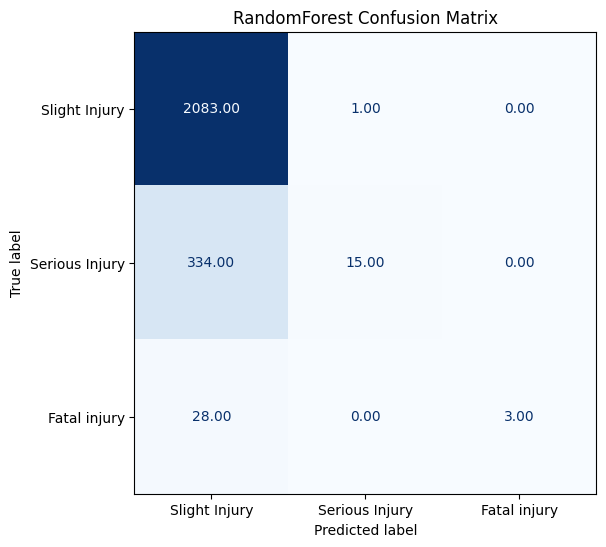

In [358]:
print(f"OOB score: {rf.oob_score_:.4f}")

evaluate_model("RandomForest", rf, X_test_enc, y_test)

acc = 84 is looks high, but the model predict almost everything as class 2 (the majority class in data) and thats not good, shows strong class imbalance issue

**Using GradientBoostingClassifier**

In [359]:
gb = GradientBoostingClassifier(
    n_estimators=200,
    learning_rate=0.10,
    max_depth=5,
    subsample=1.0,
    validation_fraction=0.2,
    n_iter_no_change=10,
    random_state=42
)
gb.fit(X_train_enc, y_train)

GradientBoostingClassifier(max_depth=5, n_estimators=200, n_iter_no_change=10,
                           random_state=42, validation_fraction=0.2)

GradientBoosting Metrics:
              precision    recall  f1-score   support

           0       0.85      0.99      0.92      2084
           1       0.63      0.06      0.11       349
           2       0.80      0.13      0.22        31

    accuracy                           0.85      2464
   macro avg       0.76      0.40      0.42      2464
weighted avg       0.82      0.85      0.80      2464

GradientBoosting Confusion Matrix:


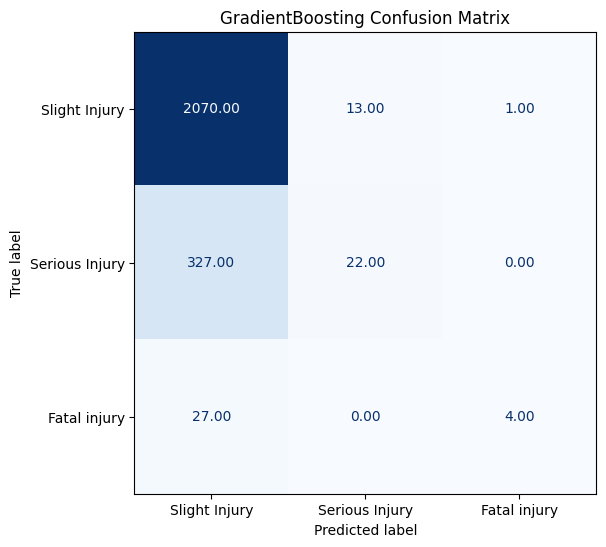

In [360]:
evaluate_model("GradientBoosting", gb, X_test_enc, y_test)

The recall in class 2 and 1 is not good, not detecting enough data

**Using VotingClassifier**

In [361]:
voting = VotingClassifier(
    estimators=[('rf', rf), ('gb', gb)],
    voting='soft',  )

# Fit
voting.fit(X_train_enc, y_train)

VotingClassifier(estimators=[('rf',
                              RandomForestClassifier(class_weight='balanced_subsample',
                                                     n_estimators=200,
                                                     n_jobs=-1, oob_score=True,
                                                     random_state=42)),
                             ('gb',
                              GradientBoostingClassifier(max_depth=5,
                                                         n_estimators=200,
                                                         n_iter_no_change=10,
                                                         random_state=42,
                                                         validation_fraction=0.2))],
                 voting='soft')

Voting Random, Forest & Gradient Boosting Metrics:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92      2084
           1       0.89      0.05      0.09       349
           2       1.00      0.13      0.23        31

    accuracy                           0.85      2464
   macro avg       0.91      0.39      0.41      2464
weighted avg       0.86      0.85      0.79      2464

Voting Random, Forest & Gradient Boosting Confusion Matrix:


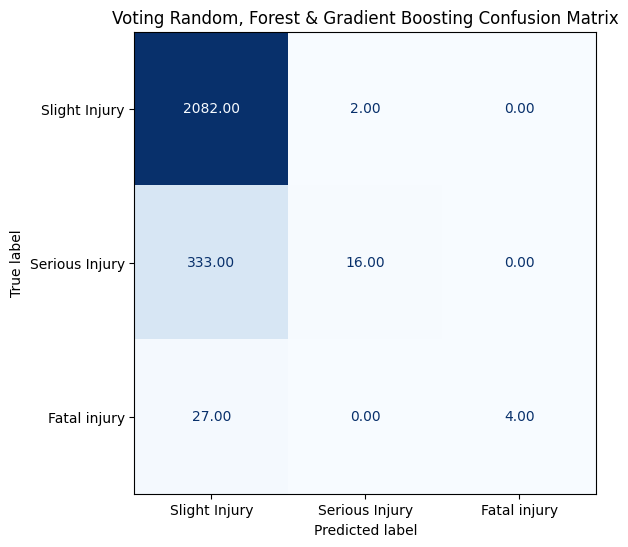

In [362]:
evaluate_model("Voting Random, Forest & Gradient Boosting", voting, X_test_enc, y_test)

# **Modeling Part 2: SMOTE**

In [363]:
# smote
smote = SMOTE(sampling_strategy='not majority', random_state=42)
X_train_smote, y_train_smote = smote.fit_resample(X_train_enc, y_train)

**model: RandomForestClassifier**

OOB score(With SMOTE): 0.9355
RandomForest Metrics:
              precision    recall  f1-score   support

           0       0.87      0.91      0.89      2084
           1       0.29      0.22      0.25       349
           2       0.43      0.10      0.16        31

    accuracy                           0.80      2464
   macro avg       0.53      0.41      0.43      2464
weighted avg       0.78      0.80      0.79      2464

RandomForest Confusion Matrix:


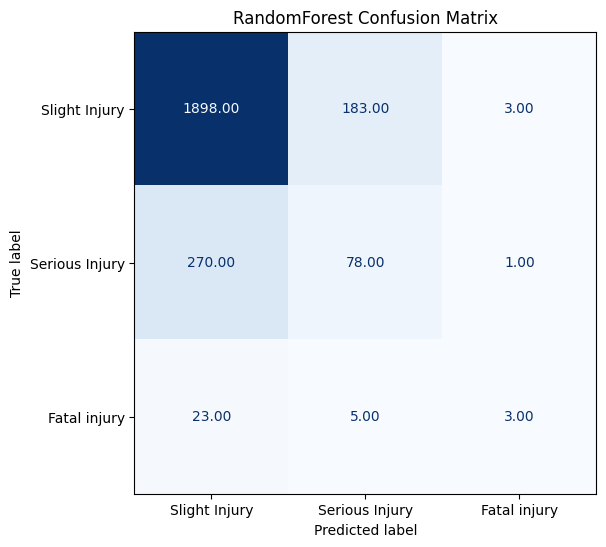

In [364]:
# model: RandomForestClassifier

rf_smote = RandomForestClassifier(
    n_estimators=200, bootstrap=True, oob_score=True, n_jobs=-1,
    class_weight='balanced_subsample', random_state=42)
rf_smote.fit(X_train_smote, y_train_smote)
print(f"OOB score(With SMOTE): {rf_smote.oob_score_:.4f}")

evaluate_model("RandomForest", rf_smote, X_test_enc, y_test)

**Using GradientBoostingClassifier**

Gradient Boosting (With SMOTE) Metrics:
              precision    recall  f1-score   support

           0       0.87      0.84      0.85      2084
           1       0.23      0.25      0.24       349
           2       0.16      0.26      0.20        31

    accuracy                           0.75      2464
   macro avg       0.42      0.45      0.43      2464
weighted avg       0.77      0.75      0.76      2464

Gradient Boosting (With SMOTE) Confusion Matrix:


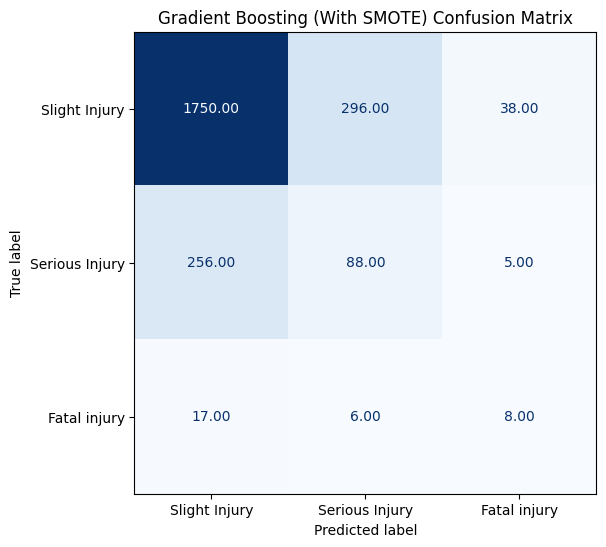

In [365]:
gb_smote = GradientBoostingClassifier(
    n_estimators=200,
    learning_rate=0.10,
    max_depth=5,
    subsample=1.0,
    validation_fraction=0.2,
    n_iter_no_change=10,
    random_state=42
)
gb_smote.fit(X_train_smote, y_train_smote)
evaluate_model("Gradient Boosting (With SMOTE)", gb_smote, X_test_enc, y_test)

Since classifiers do not perform well on unbalanced datasets. They end up correctly classifying the majority class or classes at expense of the minority class.
One way to deal with unbalanced datasets is SMOTE (Synthetic Minority Oversampling Technique). It is an algorithm that generates new sample data by creating synthetic examples that are combinations of the closest minority cases.
[Blog Source](https://medium.com/analytics-vidhya/a-random-forest-classifier-with-imbalanced-data-7ef4d9ebedb8)

So applied it to handle the imbalance in our dataset and to generates new synthetic samples for the minority classes (In our case the Fatal and Serious injuries), so that the model can learn more evenly from all classes.

This helped the models slightly improve their recall for rare injuries, though the predictions are still biased toward the “Slight” class.

In [366]:
# saving the gb_smote model
with open('gb_smote.pkl', 'wb') as f:
    pickle.dump(gb_smote, f)

In [367]:
# saving the gb model
with open('gb.pkl', 'wb') as f:
    pickle.dump(gb, f)

In [368]:
# saving the rf model
with open('rf.pkl', 'wb') as f:
    pickle.dump(rf, f)

# **Precitions On New Data**

In [369]:
data

,Day_of_week,Age_band_of_driver,Sex_of_driver,Educational_level,Vehicle_driver_relation,Driving_experience,Type_of_vehicle,Owner_of_vehicle,Area_accident_occured,Lanes_or_Medians,...,Weather_conditions,Type_of_collision,Number_of_vehicles_involved,Number_of_casualties,Vehicle_movement,Pedestrian_movement,Cause_of_accident,Accident_severity,Hour_of_day,Time_of_day
0,Monday,18-30,Male,Above high school,Employee,1-2yr,Automobile,Owner,Residential areas,Two-way (divided with broken lines road marking),...,Normal,Collision with roadside-parked vehicles,2,2,Going straight,Not a Pedestrian,Moving Backward,0,17,Afternoon
1,Monday,31-50,Male,Junior high school,Employee,Above 10yr,Public (> 45 seats),Owner,Office areas,Undivided Two way,...,Normal,Vehicle with vehicle collision,2,2,Going straight,Not a Pedestrian,Overtaking,0,17,Afternoon
2,Monday,18-30,Male,Junior high school,Employee,1-2yr,Lorry (41?100Q),Owner,Recreational areas,other,...,Normal,Collision with roadside objects,2,2,Going straight,Not a Pedestrian,Changing lane to the left,1,17,Afternoon
3,Sunday,18-30,Male,Junior high school,Employee,5-10yr,Public (> 45 seats),Governmental,Office areas,other,...,Normal,Vehicle with vehicle collision,2,2,Going straight,Not a Pedestrian,Changing lane to the right,0,1,Night
4,Sunday,18-30,Male,Junior high school,Employee,2-5yr,Automobile,Owner,Industrial areas,other,...,Normal,Vehicle with vehicle collision,2,2,Going straight,Not a Pedestrian,Overtaking,0,1,Night
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12311,Wednesday,31-50,Male,Junior high school,Employee,2-5yr,Lorry (11?40Q),Owner,Outside rural areas,Undivided Two way,...,Normal,Vehicle with vehicle collision,2,1,Going straight,Not a Pedestrian,No distancing,0,16,Afternoon
12312,Sunday,18-30,Male,Elementary school,Employee,5-10yr,Automobile,Owner,Outside rural areas,Two-way (divided with broken lines road marking),...,Normal,Vehicle with vehicle collision,2,1,Other,Not a Pedestrian,No distancing,0,18,Evening
12313,Sunday,Over 51,Male,Junior high school,Employee,5-10yr,Bajaj,Owner,Outside rural areas,Two-way (divided with broken lines road marking),...,Normal,Vehicle with vehicle collision,1,1,Other,Not a Pedestrian,Changing lane to the right,1,13,Afternoon
12314,Sunday,18-30,Female,Junior high school,Employee,Above 10yr,Lorry (41?100Q),Owner,Office areas,Undivided Two way,...,Normal,Vehicle with vehicle collision,2,1,Other,Not a Pedestrian,Driving under the influence of drugs,0,13,Afternoon


In [370]:
feature_order = X_train_enc.columns.tolist() # the model features order

inv_severity_mapping = {0: 'Slight Injury', 1: 'Serious Injury', 2: 'Fatal injury'}

def f_eng(df):
    """ Recreate the feature eng that we did in training"""
    df = df.copy()

    # Weather_Road_Interaction
    if 'Weather_Road_Interaction' in feature_order and 'Weather_Road_Interaction' not in df:
        if {'Weather_conditions','Road_surface_conditions'}.issubset(df.columns):
            df['Weather_Road_Interaction'] = (df['Weather_conditions'].astype(str) + '_' + df['Road_surface_conditions'].astype(str))

    # Night_No_Light (no Hour at inference, approximate using Time_of_day)
    if 'Night_No_Light' in feature_order and 'Night_No_Light' not in df:
        if {'Time_of_day','Light_conditions'}.issubset(df.columns):
            night_like = df['Time_of_day'].isin(['Evening','Night'])
            no_light   = df['Light_conditions'].eq('Darkness - no lighting')
            df['Night_No_Light'] = (night_like & no_light).astype(int)

    return df

# --------------------------------------------------------------
#  transform the input with the same pre processing we did
def transform_inputs(x_dict, ord_enc, ordinal_features, label_encoders, feature_order):
    df = pd.DataFrame([x_dict]).copy()

    # engineered columns
    df = f_eng(df)

    # ensure all expected columns exist
    for c in feature_order:
        if c not in df:
            df[c] = np.nan

    # ordinal enc
    ord_cols = [c for c in ordinal_features.keys() if c in df.columns]
    if ord_cols:
        df[ord_cols] = ord_enc.transform(df[ord_cols])

    # label encoder
    for col, le in label_encoders.items():
      if col in df.columns:
        mapping = {cls:i for i, cls in enumerate(le.classes_)}
        df[col] = df[col].map(mapping)

    # cast to numeric and reorder
    df = df[feature_order].apply(pd.to_numeric, errors='coerce').fillna(0)
    return df

# predict function
def pred(x_dict):
    X = transform_inputs(x_dict, ord_enc, ordinal_features, label_encoders, feature_order)
    pred_id = rf.predict(X)[0]
    probs   = rf.predict_proba(X)[0]
    pred_lbl = inv_severity_mapping[pred_id]
    return pred_lbl, dict(zip(inv_severity_mapping.values(), probs))

In [371]:
# Sample 1 : Serious Injury
X_new1 = {
    'Time_of_day': 'Afternoon',
    'Day_of_week': 'Thursday',
    'Age_band_of_driver': '18-30',
    'Educational_level': 'Junior high school',
    'Driving_experience': '2-5yr',
    'Light_conditions': 'Daylight',

    'Area_accident_occured': 'Church areas',
    'Lanes_or_Medians': 'Undivided Two way',
    'Road_allignment': 'Tangent road with flat terrain',
    'Types_of_Junction': 'Crossing',
    'Road_surface_type': 'Asphalt roads',
    'Type_of_collision': 'Collision with animals',
    'Vehicle_movement': 'Moving Backward',
    'Weather_conditions': 'Normal',
    'Sex_of_driver': 'Male',
    'Cause_of_accident': 'Overtaking',
    'Type_of_vehicle': 'Lorry (11?40Q)',
    'Road_surface_conditions': 'Dry',
    'Owner_of_vehicle': 'Owner',
    'Pedestrian_movement': 'Not a Pedestrian',
    'Vehicle_driver_relation': 'Driver',

    'Hour_of_day' : 7,

    'Number_of_vehicles_involved': 1,
    'Number_of_casualties': 1,
}

label1, proba1 = pred(X_new1)
print("Prediction:", label1)
print("Probabilities:", proba1)

Prediction: Slight Injury
Probabilities: {'Slight Injury': np.float64(0.625), 'Serious Injury': np.float64(0.375), 'Fatal injury': np.float64(0.0)}


In [372]:
# Sample 2 : Slight Injury
X_new2 = {
    'Time_of_day': 'Morning',
    'Day_of_week': 'Thursday',
    'Age_band_of_driver': '31-50',
    'Educational_level': 'Junior high school',
    'Driving_experience': '5-10yr',
    'Light_conditions': 'Daylight',

    'Area_accident_occured': 'Office areas',
    'Lanes_or_Medians': 'Undivided Two way',
    'Road_allignment': 'Tangent road with mild grade and flat terrain',
    'Types_of_Junction': 'No junction',
    'Road_surface_type': 'Earth roads',
    'Type_of_collision': 'Vehicle with vehicle collision',
    'Vehicle_movement': 'Going straight',
    'Weather_conditions': 'Normal',
    'Sex_of_driver': 'Male',
    'Cause_of_accident': 'Overtaking',
    'Type_of_vehicle': 'Automobile',
    'Road_surface_conditions': 'Dry',
    'Owner_of_vehicle': 'Owner',
    'Pedestrian_movement': 'Not a Pedestrian',
    'Vehicle_driver_relation': 'Driver',

    'Hour_of_day' : 17,
    'Number_of_vehicles_involved': 1,
    'Number_of_casualties': 4
}
label2, proba2 = pred(X_new2)
print("Prediction:", label2)
print("Probabilities:", proba2)

Prediction: Slight Injury
Probabilities: {'Slight Injury': np.float64(0.825), 'Serious Injury': np.float64(0.145), 'Fatal injury': np.float64(0.03)}


In [373]:
# Sample 3 : Fatal Injury
X_new3 = {
    'Time_of_day': 'Afternoon',
    'Day_of_week': 'Sunday',
    'Age_band_of_driver': '31-50',
    'Educational_level': 'Junior high school',
    'Driving_experience': 'Above 10yr',
    'Light_conditions': 'Daylight',

    'Area_accident_occured': 'Other',
    'Lanes_or_Medians': 'Two-way (divided with broken lines road marking)',
    'Road_allignment': 'Tangent road with flat terrain',
    'Types_of_Junction': 'No junction',
    'Road_surface_type': 'Earth roads',
    'Type_of_collision': 'Vehicle with vehicle collision',
    'Vehicle_movement': 'Going straight',
    'Weather_conditions': 'Normal',
    'Sex_of_driver': 'Male',
    'Cause_of_accident': 'Moving Backward',
    'Type_of_vehicle': 'Lorry (41?100Q)',
    'Road_surface_conditions': 'Dry',
    'Owner_of_vehicle': 'Owner',
    'Pedestrian_movement': 'Not a Pedestrian',
    'Vehicle_driver_relation': 'Driver',

    'Hour_of_day' : 15,
    'Number_of_vehicles_involved': 2,
    'Number_of_casualties': 1
}
label3, proba3 = pred(X_new3)
print("Prediction:", label3)
print("Probabilities:", proba3)

Prediction: Fatal injury
Probabilities: {'Slight Injury': np.float64(0.275), 'Serious Injury': np.float64(0.035), 'Fatal injury': np.float64(0.69)}


In [374]:
# Pringing each columns unqiue labels (just to help with UI dropdown input)
for col in data.columns:
    print("="*70)
    print(f"{col}  |  dtype: {data[col].dtype}  |  unique: {data[col].nunique()}")
    print(data[col].unique())
    print()

Day_of_week  |  dtype: category  |  unique: 7
['Monday', 'Sunday', 'Friday', 'Wednesday', 'Saturday', 'Thursday', 'Tuesday']
Categories (7, object): ['Friday', 'Monday', 'Saturday', 'Sunday', 'Thursday', 'Tuesday',
                         'Wednesday']

Age_band_of_driver  |  dtype: category  |  unique: 4
['18-30', '31-50', 'Under 18', 'Over 51']
Categories (4, object): ['18-30', '31-50', 'Over 51', 'Under 18']

Sex_of_driver  |  dtype: category  |  unique: 2
['Male', 'Female']
Categories (2, object): ['Female', 'Male']

Educational_level  |  dtype: category  |  unique: 6
['Above high school', 'Junior high school', 'Elementary school', 'High school', 'Illiterate', 'Writing & reading']
Categories (6, object): ['Above high school', 'Elementary school', 'High school', 'Illiterate',
                         'Junior high school', 'Writing & reading']

Vehicle_driver_relation  |  dtype: category  |  unique: 3
['Employee', NaN, 'Owner', 'Other']
Categories (3, object): ['Employee', 'Other', '

In [375]:
# (for UI dropdowns)
DropDown_CHOICES = {}

# Ordinal choices
for col, cats in zip(ordinal_features.keys(), ord_enc.categories_):
    DropDown_CHOICES[col] = list(cats)

# Nominal choices
for col, le in label_encoders.items():
    DropDown_CHOICES[col] = list(le.classes_)

# Numeric ranges
DropDown_CHOICES['Number_of_casualties'] = sorted(data['Number_of_casualties'].unique().tolist())
DropDown_CHOICES['Number_of_vehicles_involved'] = sorted(data['Number_of_vehicles_involved'].unique().tolist())

In [376]:
DropDown_CHOICES

{'Time_of_day': ['Night', 'Morning', 'Afternoon', 'Evening'],
 'Day_of_week': ['Sunday',
  'Monday',
  'Tuesday',
  'Wednesday',
  'Thursday',
  'Friday',
  'Saturday'],
 'Age_band_of_driver': ['Under 18', '18-30', '31-50', 'Over 51'],
 'Educational_level': ['Illiterate',
  'Writing & reading',
  'Elementary school',
  'Junior high school',
  'High school',
  'Above high school'],
 'Driving_experience': ['No Licence',
  'Below 1yr',
  '1-2yr',
  '2-5yr',
  '5-10yr',
  'Above 10yr'],
 'Light_conditions': ['Darkness - no lighting',
  'Darkness - lights unlit',
  'Darkness - lights lit',
  'Daylight'],
 'Area_accident_occured': ['Church areas',
  'Hospital areas',
  'Industrial areas',
  'Market areas',
  'Office areas',
  'Other',
  'Outside rural areas',
  'Recreational areas',
  'Residential areas',
  'Rural village areas',
  'Rural village areasOffice areas',
  'School areas'],
 'Lanes_or_Medians': ['Double carriageway (median)',
  'One way',
  'Two-way (divided with broken lines road

In [377]:
data.dtypes

,0
Day_of_week,category
Age_band_of_driver,category
Sex_of_driver,category
Educational_level,category
Vehicle_driver_relation,category
Driving_experience,category
Type_of_vehicle,category
Owner_of_vehicle,category
Area_accident_occured,category
Lanes_or_Medians,category


# ***Encoding : One-Hot Encoding***

In [378]:
y_train_num = y_train.astype(int)

In [379]:
y_train_num.dtype

dtype('int64')

In [380]:
target_encode_cols = [
    'Type_of_vehicle', 'Area_accident_occured', 'Cause_of_accident',
    'Weather_Road_Interaction', 'Lanes_or_Medians', 'Road_allignment', 'Types_of_Junction'
]

ohe_cols = [
    'Day_of_week', 'Sex_of_driver', 'Age_band_of_driver', 'Weather_conditions',
    'Road_surface_conditions', 'Light_conditions', 'Educational_level', 'Time_of_day',
    'Vehicle_driver_relation', 'Driving_experience', 'Owner_of_vehicle', 'Road_surface_type','Type_of_collision','Pedestrian_movement','Vehicle_movement'
]

# a) Target Encoding
target_encoding_mappings = {}
global_target_mean = y_train_num.mean()
target_encoding_mappings['__global_mean__'] = global_target_mean

for col in target_encode_cols:
    target_mean_map = y_train_num.groupby(X_train_eng[col]).mean()
    target_encoding_mappings[col] = target_mean_map.to_dict()
    X_train_eng[col] = X_train_eng[col].map(target_mean_map)
    X_test_eng[col] = X_test_eng[col].map(target_mean_map)

    # Convert to float before filling NaN
    X_train_eng[col] = X_train_eng[col].astype(float)
    X_test_eng[col] = X_test_eng[col].astype(float)

    X_train_eng[col].fillna(global_target_mean, inplace=True)
    X_test_eng[col].fillna(global_target_mean, inplace=True)


# b) One-Hot Encoding
X_train_final = pd.get_dummies(X_train_eng, columns=ohe_cols, drop_first=True)
X_test_final = pd.get_dummies(X_test_eng, columns=ohe_cols, drop_first=True)

# Align columns to ensure consistency
train_cols = X_train_final.columns
test_cols = X_test_final.columns
missing_in_test = set(train_cols) - set(test_cols)
for c in missing_in_test:
    X_test_final[c] = 0
missing_in_train = set(test_cols) - set(train_cols)
for c in missing_in_train:
    X_train_final[c] = 0
X_test_final = X_test_final[train_cols]


# -Display Final Results
print("--- Training Data Head (After FULL Engineering and Encoding) ---")
display_cols = [col for col in X_train_final.columns if 'Day_of_week' in str(col) or 'Educational_level' in str(col) or 'Lanes_or_Medians' in str(col)]
print(X_train_final[display_cols].head())

print(f"\nShape of final training data: {X_train_final.shape}")
print("All categorical columns should now be converted to numbers.")

--- Training Data Head (After FULL Engineering and Encoding) ---
      Lanes_or_Medians  Day_of_week_Monday  Day_of_week_Saturday  \
3093          0.169328               False                 False   
4394          0.169328               False                 False   
584           0.169328               False                  True   
7724          0.169328               False                 False   
5532          0.169328               False                 False   

      Day_of_week_Sunday  Day_of_week_Thursday  Day_of_week_Tuesday  \
3093               False                 False                False   
4394                True                 False                False   
584                False                 False                False   
7724               False                 False                 True   
5532                True                 False                False   

      Day_of_week_Wednesday  Educational_level_Elementary school  \
3093                   True    

## Modeling

In [381]:
from sklearn.pipeline import Pipeline

###  Create Pipeline

In [382]:
# 1. Create a pipeline to streamline the process
pipeline = Pipeline([
    ('classifier', RandomForestClassifier(random_state=42))
])

# 2. Define the parameter grid to search through
param_grid = [
    {
        'classifier': [RandomForestClassifier(random_state=42, class_weight='balanced')],
        'classifier__n_estimators': [100, 200],
        'classifier__max_depth': [10, 20],
        'classifier__min_samples_leaf': [2, 4]
    },
    {
        'classifier': [GradientBoostingClassifier(random_state=42)],
        'classifier__n_estimators': [100, 200],
        'classifier__learning_rate': [0.05, 0.1],
        'classifier__max_depth': [3, 5]
    }
]


### Training the model on all features

In [383]:
# 3. Setup and run GridSearchCV

grid_search = GridSearchCV(pipeline, param_grid, cv=5, scoring='f1_weighted', n_jobs=-1, verbose=1)
grid_search.fit(X_train_final, y_train)

Fitting 5 folds for each of 16 candidates, totalling 80 fits


GridSearchCV(cv=5,
             estimator=Pipeline(steps=[('classifier',
                                        RandomForestClassifier(random_state=42))]),
             n_jobs=-1,
             param_grid=[{'classifier': [RandomForestClassifier(class_weight='balanced',
                                                                random_state=42)],
                          'classifier__max_depth': [10, 20],
                          'classifier__min_samples_leaf': [2, 4],
                          'classifier__n_estimators': [100, 200]},
                         {'classifier': [GradientBoostingClassifier(random_state=42)],
                          'classifier__learning_rate': [0.05, 0.1],
                          'classifier__max_depth': [3, 5],
                          'classifier__n_estimators': [100, 200]}],
             scoring='f1_weighted', verbose=1)

### Selecting best model




In [384]:
# Print the f1_weighted score for each model
print("--- F1 Weighted Scores for Each Model ---")
results = grid_search.cv_results_
for mean_score, params in zip(results["mean_test_score"], results["params"]):
    print(f"Score: {mean_score:.4f} for params: {params}")

--- F1 Weighted Scores for Each Model ---
Score: 0.7933 for params: {'classifier': RandomForestClassifier(class_weight='balanced', random_state=42), 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 2, 'classifier__n_estimators': 100}
Score: 0.7927 for params: {'classifier': RandomForestClassifier(class_weight='balanced', random_state=42), 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 2, 'classifier__n_estimators': 200}
Score: 0.7868 for params: {'classifier': RandomForestClassifier(class_weight='balanced', random_state=42), 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 4, 'classifier__n_estimators': 100}
Score: 0.7906 for params: {'classifier': RandomForestClassifier(class_weight='balanced', random_state=42), 'classifier__max_depth': 10, 'classifier__min_samples_leaf': 4, 'classifier__n_estimators': 200}
Score: 0.7874 for params: {'classifier': RandomForestClassifier(class_weight='balanced', random_state=42), 'classifier__max_depth': 20, 'class

In [385]:
# 4. Get the best model and print the results
print("--- Grid Search Results ---")
print(f"Best F1 Score (Weighted): {grid_search.best_score_:.4f}")
print("\nBest Model and Hyperparameters:")
print(grid_search.best_params_)

--- Grid Search Results ---
Best F1 Score (Weighted): 0.8060

Best Model and Hyperparameters:
{'classifier': GradientBoostingClassifier(random_state=42), 'classifier__learning_rate': 0.1, 'classifier__max_depth': 5, 'classifier__n_estimators': 200}


#### Evaluate the best model on all features

In [386]:
# 5.1 Evaluate the best model on the train set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_train_final)
# Define target names for a readable report
target_names = ['Slight Injury (0)', 'Serious Injury (1)', 'Fatal injury (2)']

print("\n--- Classification Report for the Best Model on train Data ---")
print(classification_report(y_train, y_pred, target_names=target_names))


--- Classification Report for the Best Model on train Data ---
                    precision    recall  f1-score   support

 Slight Injury (0)       0.90      1.00      0.95      8331
Serious Injury (1)       0.99      0.37      0.54      1394
  Fatal injury (2)       1.00      0.87      0.93       127

          accuracy                           0.91      9852
         macro avg       0.97      0.75      0.81      9852
      weighted avg       0.92      0.91      0.89      9852



In [387]:
# 5.2 Evaluate the best model on the test set
best_model = grid_search.best_estimator_
y_pred = best_model.predict(X_test_final)
# Define target names for a readable report
target_names = ['Slight Injury (0)', 'Serious Injury (1)', 'Fatal injury (2)']

print("\n--- Classification Report for the Best Model on Test Data ---")
print(classification_report(y_test, y_pred, target_names=target_names))


--- Classification Report for the Best Model on Test Data ---
                    precision    recall  f1-score   support

 Slight Injury (0)       0.86      0.99      0.92      2084
Serious Injury (1)       0.56      0.09      0.16       349
  Fatal injury (2)       0.67      0.13      0.22        31

          accuracy                           0.85      2464
         macro avg       0.69      0.40      0.43      2464
      weighted avg       0.81      0.85      0.80      2464



### Select top 30 features

In [388]:
# 6. Extract and display the top 30 features from the best model
print("\n--- Top 30 Most Important Features ---")
# The actual classifier is in the 'classifier' step of the pipeline
final_classifier = best_model.named_steps['classifier']

# Get feature importances
importances = final_classifier.feature_importances_
feature_names = X_train_final.columns

# Create a DataFrame for visualization
feature_importance_df = pd.DataFrame({'feature': feature_names, 'importance': importances})
feature_importance_df = feature_importance_df.sort_values('importance', ascending=False).head(30)

print(feature_importance_df)


--- Top 30 Most Important Features ---
                                             feature  importance
5                        Number_of_vehicles_involved    0.103599
8                                        Hour_of_day    0.101653
6                               Number_of_casualties    0.074074
7                                  Cause_of_accident    0.059872
4                                  Types_of_Junction    0.054508
1                              Area_accident_occured    0.042076
0                                    Type_of_vehicle    0.036287
9                           Weather_Road_Interaction    0.034840
2                                   Lanes_or_Medians    0.029635
3                                    Road_allignment    0.025235
16                             Day_of_week_Wednesday    0.019027
33                         Light_conditions_Daylight    0.018798
12                              Day_of_week_Saturday    0.018484
13                                Day_of_week_Sund

### Training the model on top 30 features

In [389]:
# Get the list of top 30 feature names
top_30_features = feature_importance_df['feature'].tolist()

# Filter your training and testing data
X_train_top30 = X_train_final[top_30_features]
X_test_top30 = X_test_final[top_30_features]

# Retrain the BEST model on this smaller dataset
final_model = grid_search.best_estimator_ # This is already trained, so we can re-fit it
final_model.fit(X_train_top30, y_train)



Pipeline(steps=[('classifier',
                 GradientBoostingClassifier(max_depth=5, n_estimators=200,
                                            random_state=42))])

#### Evaluate the best model on top 30 features

In [390]:
print("\n--- Classification Report for the Best Model on train Data with Top 30 Features ---")
y_pred = final_model.predict(X_train_top30)
print(classification_report(y_train, y_pred, target_names=target_names))


--- Classification Report for the Best Model on train Data with Top 30 Features ---
                    precision    recall  f1-score   support

 Slight Injury (0)       0.90      1.00      0.95      8331
Serious Injury (1)       0.99      0.38      0.55      1394
  Fatal injury (2)       1.00      0.86      0.92       127

          accuracy                           0.91      9852
         macro avg       0.97      0.75      0.81      9852
      weighted avg       0.92      0.91      0.89      9852



In [391]:
print("\n--- Classification Report for the Best Model on Test Data with Top 30 Features ---")
y_pred_final = final_model.predict(X_test_top30)
print(classification_report(y_test, y_pred_final, target_names=target_names))


--- Classification Report for the Best Model on Test Data with Top 30 Features ---
                    precision    recall  f1-score   support

 Slight Injury (0)       0.86      0.99      0.92      2084
Serious Injury (1)       0.65      0.12      0.21       349
  Fatal injury (2)       0.56      0.16      0.25        31

          accuracy                           0.85      2464
         macro avg       0.69      0.42      0.46      2464
      weighted avg       0.83      0.85      0.81      2464



Gradient Boosting Metrics:
              precision    recall  f1-score   support

           0       0.86      0.99      0.92      2084
           1       0.65      0.12      0.21       349
           2       0.56      0.16      0.25        31

    accuracy                           0.85      2464
   macro avg       0.69      0.42      0.46      2464
weighted avg       0.83      0.85      0.81      2464

Gradient Boosting Confusion Matrix:


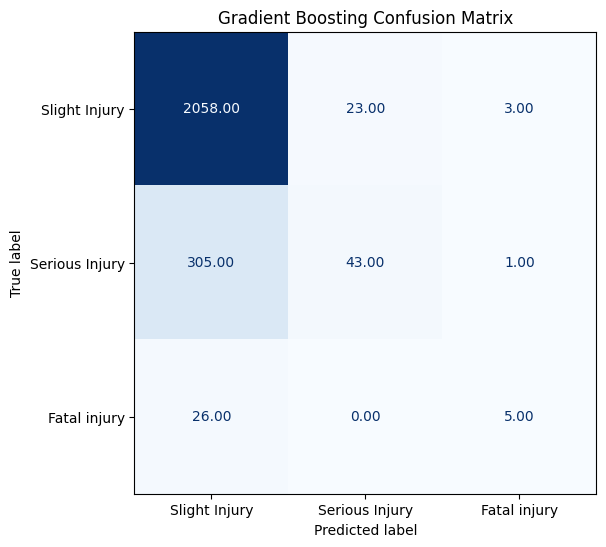

In [392]:
evaluate_model("Gradient Boosting", final_model, X_test_top30, y_test)

### Handle  imbalanced classes by SMOTE

In [393]:
# 1. Instantiate and apply SMOTE only on the training data
print("Class distribution before SMOTE:")
print(y_train.value_counts())

smote = SMOTE(random_state=42)
X_train_resampled, y_train_resampled = smote.fit_resample(X_train_top30, y_train)

print("\nClass distribution after SMOTE:")
print(y_train_resampled.value_counts())


# 2. Retrain your best model on the new, balanced data
print("\nRetraining the best model on the resampled data...")
# Use the same winning model from GridSearchCV
final_model.fit(X_train_resampled, y_train_resampled)


Class distribution before SMOTE:
Accident_severity
0    8331
1    1394
2     127
Name: count, dtype: int64

Class distribution after SMOTE:
Accident_severity
2    8331
1    8331
0    8331
Name: count, dtype: int64

Retraining the best model on the resampled data...


Pipeline(steps=[('classifier',
                 GradientBoostingClassifier(max_depth=5, n_estimators=200,
                                            random_state=42))])

#### Evaluate the model after SMOTE

In [394]:
# 3.1 Evaluate the new model on the original, Train data
print("\n--- Final Classification Report After Using SMOTE ---")
y_pred_smote = final_model.predict(X_train_top30)
print(classification_report(y_train, y_pred_smote, target_names=target_names))


--- Final Classification Report After Using SMOTE ---
                    precision    recall  f1-score   support

 Slight Injury (0)       0.89      1.00      0.94      8331
Serious Injury (1)       0.95      0.28      0.43      1394
  Fatal injury (2)       0.97      0.70      0.81       127

          accuracy                           0.89      9852
         macro avg       0.94      0.66      0.73      9852
      weighted avg       0.90      0.89      0.87      9852



In [395]:
# 3.2 Evaluate the new model on the original, untouched test data
print("\n--- Final Classification Report After Using SMOTE on Test Data---")
y_pred_smote = final_model.predict(X_test_top30)
print(classification_report(y_test, y_pred_smote, target_names=target_names))


--- Final Classification Report After Using SMOTE on Test Data---
                    precision    recall  f1-score   support

 Slight Injury (0)       0.86      0.98      0.92      2084
Serious Injury (1)       0.54      0.09      0.15       349
  Fatal injury (2)       0.38      0.16      0.23        31

          accuracy                           0.85      2464
         macro avg       0.60      0.41      0.43      2464
      weighted avg       0.81      0.85      0.80      2464



Gradient Boosting (With SMOTE) Metrics:
              precision    recall  f1-score   support

           0       0.86      0.98      0.92      2084
           1       0.54      0.09      0.15       349
           2       0.38      0.16      0.23        31

    accuracy                           0.85      2464
   macro avg       0.60      0.41      0.43      2464
weighted avg       0.81      0.85      0.80      2464

Gradient Boosting (With SMOTE) Confusion Matrix:


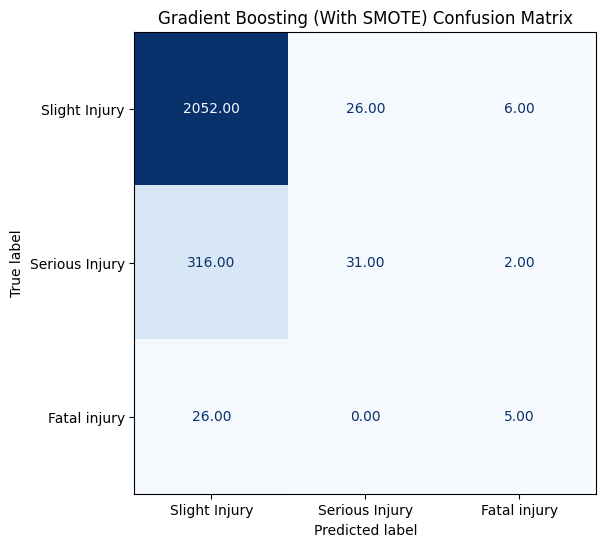

In [396]:
evaluate_model("Gradient Boosting (With SMOTE)", final_model, X_test_top30, y_test)

## Key Insights

*   The best f1-score achieved was around 85%, and this result was similar across all the best performing models.
*   Reducing the dimensionality to 30 features and applying SMOTE did not significantly improve the model's performance.
*   The most important features were the hour of the day and details about the accident such as the number of vehicles involved, followed by weather and road conditions.